In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import duckdb
from matplotlib.ticker import MaxNLocator
import geopandas
from shapely import wkt
import geoplot as gplt
import geoplot.crs as gcrs
import numpy as np

# Analysis

1. [Number of trips over time (daily, monthy) and Seasonality](#Number-of-Trips-Over-Time-(Daily,-Monthy,-Etc))
3. [The distribution of rides over chicago (where rides happen the most)](#Visualize-the-data-by-pickup_community_area)
4. [Rides over time for Community areas](#Rides-over-time-for-Community-areas)
5. [Correlation between the number of rides in each community](#Correlation-Between-Commuinity-Areas-For-Pickups )
6. [Fare amount for each community](#Fare-amount-for-each-community)
7. [Weather Patterns](#Weather-Patterns)

In [2]:
plt.style.use('fivethirtyeight')
DAY_OF_WEEK_MAP = {
    1: "Monday",
    2: "Tuesday",
    3: "Wednesday",
    4: "Thursday",
    5: "Friday",
    6: "Saturday",
    0: "Sunday"
}

#### Connect to duckdb

In [7]:
conn = duckdb.connect("rides.ddb")

In [ ]:
# !!! Run after done running cells !!!
conn.close()

In [5]:
def fetch_df_from_query(query):
    return conn.execute(query).fetch_df()

### duckdb Table Creation (This cell takes a while)

In [4]:
conn.sql(
    """
    CREATE TABLE IF NOT EXISTS RIDES AS 
    SELECT
        trip_id,
        CAST(trip_start_timestamp AS TIMESTAMP) AS trip_start_timestamp,
        CAST(trip_end_timestamp AS TIMESTAMP) AS trip_end_timestamp,
        trip_seconds,
        trip_miles,
        pickup_census_tract,
        dropoff_census_tract,
        pickup_community_area,
        dropoff_community_area,
        fare,
        tip,
        additional_charges,
        trip_total,
        shared_trip_authorized,
        trips_pooled,
        pickup_centroid_latitude,
        pickup_centroid_longitude,
        pickup_centroid_location,
        dropoff_centroid_latitude,
        dropoff_centroid_longitude,
        dropoff_centroid_location
    FROM 'data/rides_chunk_*.parquet';
    """
)
conn.commit()

Check for duplicates i.e. that number of unique trip_ids = length of data

In [8]:
conn.execute("""
    SELECT count(trip_id)
    FROM RIDES
    """
).fetch_df()

,count(trip_id)
0,150000000


In [6]:
sql = """
    CREATE TABLE IF NOT EXISTS RIDES_EXTRA_VARS AS
    SELECT *,
    year(trip_start_timestamp) as trip_start_year,
    MONTH(trip_start_timestamp) as trip_start_month,
    DAY(trip_start_timestamp) as trip_start_day,
    DAYOFWEEK(trip_start_timestamp) as trip_start_day_of_week,
    HOUR(trip_start_timestamp) as trip_start_hour
    FROM RIDES
"""

conn.sql(sql)
conn.commit()

### Get the range of dates the data covers

In [ ]:
result = conn.execute(
    """
    SELECT min(trip_start_timestamp), max(trip_start_timestamp)
    FROM RIDES_EXTRA_VARS
    """
).fetch_df()
result

,min(trip_start_timestamp),max(trip_start_timestamp)
0,2020-03-09 09:30:00,2022-12-31 23:45:00


### Look at what columns are present

In [26]:
columns = conn.execute(
    """
    SELECT *
    FROM RIDES_EXTRA_VARS
    LIMIT 1
    """
).fetch_df().columns
columns

Index(['trip_id', 'trip_start_timestamp', 'trip_end_timestamp', 'trip_seconds',
       'trip_miles', 'pickup_census_tract', 'dropoff_census_tract',
       'pickup_community_area', 'dropoff_community_area', 'fare', 'tip',
       'additional_charges', 'trip_total', 'shared_trip_authorized',
       'trips_pooled', 'pickup_centroid_latitude', 'pickup_centroid_longitude',
       'pickup_centroid_location', 'dropoff_centroid_latitude',
       'dropoff_centroid_longitude', 'dropoff_centroid_location',
       'trip_start_year', 'trip_start_month', 'trip_start_day',
       'trip_start_day_of_week', 'trip_start_hour'],
      dtype='object')

In [9]:
query = """
    SELECT * FROM RIDES_EXTRA_VARS USING SAMPLE 100000
"""
sample = conn.execute(query).fetch_df()
sample.describe()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,dropoff_community_area,fare,tip,...,trips_pooled,pickup_centroid_latitude,pickup_centroid_longitude,dropoff_centroid_latitude,dropoff_centroid_longitude,trip_start_year,trip_start_month,trip_start_day,trip_start_day_of_week,trip_start_hour
count,100000,100000,99996.0,100000.000000,5.087900e+04,5.079500e+04,91591.000000,91080.000000,99908.000000,99908.000000,...,100000.000000,91787.000000,91787.000000,91306.000000,91306.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000
mean,2021-10-25 12:09:39.833999,2021-10-25 12:27:13.643999,1051.209598,6.847366,1.703138e+10,1.703139e+10,27.788898,28.215316,17.534532,1.016455,...,1.006510,41.886824,-87.670995,41.887300,-87.672913,2021.26652,7.105640,15.770080,3.263870,13.663370
min,2020-03-09 09:30:00,2020-03-09 10:00:00,1.0,0.000000,1.703101e+10,1.703101e+10,1.000000,1.000000,0.000000,0.000000,...,1.000000,41.650222,-87.913625,41.650222,-87.913625,2020.00000,1.000000,1.000000,0.000000,0.000000
25%,2021-03-24 17:26:15,2021-03-24 17:45:00,537.0,2.040000,1.703108e+10,1.703108e+10,8.000000,8.000000,10.000000,0.000000,...,1.000000,41.860190,-87.694020,41.867902,-87.694532,2021.00000,4.000000,9.000000,1.000000,9.000000
50%,2021-11-18 18:00:00,2021-11-18 18:30:00,858.0,4.122900,1.703124e+10,1.703124e+10,24.000000,25.000000,15.000000,0.000000,...,1.000000,41.893216,-87.655912,41.893216,-87.655912,2021.00000,7.000000,15.000000,3.000000,15.000000
75%,2022-06-28 15:45:00,2022-06-28 16:00:00,1359.0,8.876975,1.703183e+10,1.703183e+10,37.000000,38.000000,22.500000,0.000000,...,1.000000,41.934659,-87.631717,41.934762,-87.631717,2022.00000,10.000000,23.000000,5.000000,19.000000
max,2022-12-31 23:45:00,2023-01-01 00:30:00,12290.0,216.669500,1.703198e+10,1.703198e+10,77.000000,77.000000,397.500000,100.000000,...,5.000000,42.021224,-87.530712,42.021224,-87.534903,2022.00000,12.000000,31.000000,6.000000,23.000000
std,NaN,NaN,739.194308,7.634754,3.424623e+05,3.454720e+05,21.766856,22.028514,13.611350,2.609468,...,0.093956,0.070280,0.067553,0.070034,0.071404,0.75609,3.298125,8.675983,2.077606,6.281628


In [12]:
sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   trip_id                     100000 non-null  object        
 1   trip_start_timestamp        100000 non-null  datetime64[us]
 2   trip_end_timestamp          100000 non-null  datetime64[us]
 3   trip_seconds                99996 non-null   Int64         
 4   trip_miles                  100000 non-null  float64       
 5   pickup_census_tract         50879 non-null   float64       
 6   dropoff_census_tract        50795 non-null   float64       
 7   pickup_community_area       91591 non-null   float64       
 8   dropoff_community_area      91080 non-null   float64       
 9   fare                        99908 non-null   float64       
 10  tip                         99908 non-null   float64       
 11  additional_charges          99908 non-nu

## Non-conditional analysis

### Distributions of when rides occur

In [65]:
def plot_distributions(df:pd.DataFrame, columns, n_bins: list | None= None):
    n_columns = len(columns)
    fix, axs = plt.subplots(n_columns, figsize=(10, 4*n_columns))
    for i, col in enumerate(columns):
        args = {
                "data": sample,
                "x": col,
        }

        try:
            axs[i]
        except TypeError:
            ax = axs
            args['ax'] = ax
        else:
            ax = axs[i]
            args['ax'] = ax

        
        if n_bins:
            args["bins"] = n_bins[i]

        sb.histplot(**args)
        string = col.replace("_", " ").title()
        
        ax.set_title(f"Distribution of {string}")
        ax.set_xlabel(string)

    plt.tight_layout()

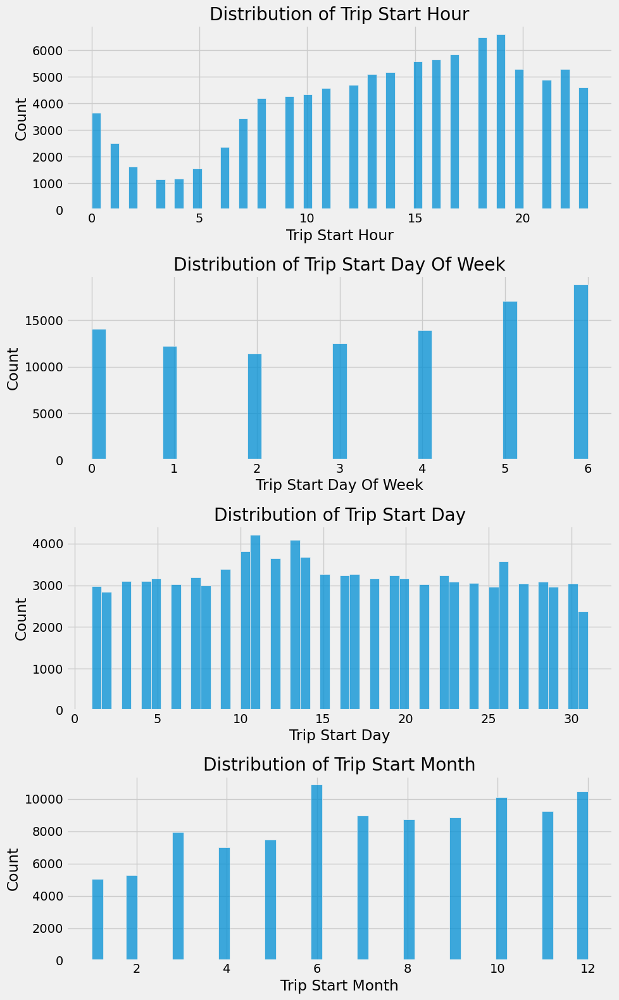

In [67]:
timeframes = ["trip_start_hour", "trip_start_day_of_week", "trip_start_day", "trip_start_month"]
plot_distributions(sample, timeframes)

### Distributions of fees

In [43]:
columns

Index(['trip_id', 'trip_start_timestamp', 'trip_end_timestamp', 'trip_seconds',
       'trip_miles', 'pickup_census_tract', 'dropoff_census_tract',
       'pickup_community_area', 'dropoff_community_area', 'fare', 'tip',
       'additional_charges', 'trip_total', 'shared_trip_authorized',
       'trips_pooled', 'pickup_centroid_latitude', 'pickup_centroid_longitude',
       'pickup_centroid_location', 'dropoff_centroid_latitude',
       'dropoff_centroid_longitude', 'dropoff_centroid_location',
       'trip_start_year', 'trip_start_month', 'trip_start_day',
       'trip_start_day_of_week', 'trip_start_hour'],
      dtype='object')

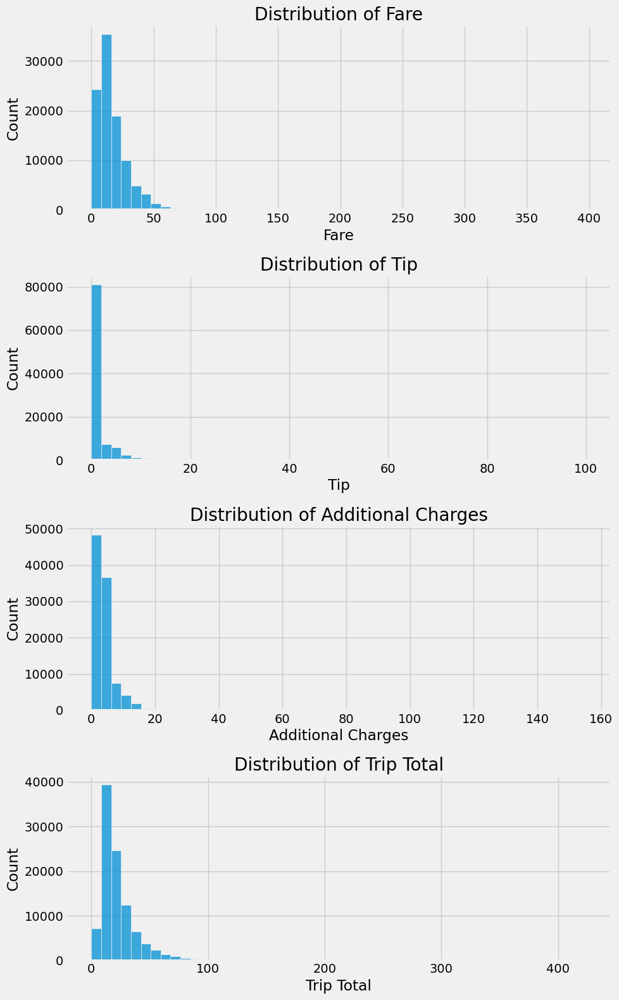

In [56]:
# Distributions of fees
columns = ["fare", "tip", "additional_charges", "trip_total"]
bins = [50, 50 , 50 , 50]
plot_distributions(sample, columns, n_bins=bins)

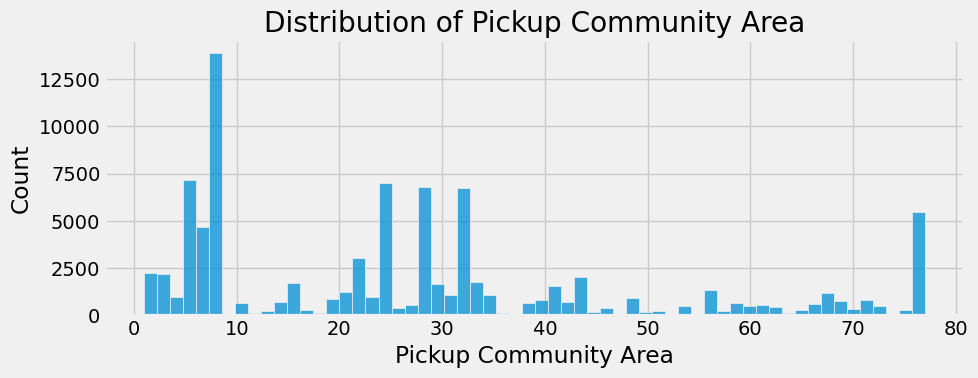

In [ ]:
columns = ["pickup_community_area"]
plot_distributions(sample, columns)

# Number of Trips Over Time (Daily, Monthy, Etc)

In [9]:
def group_by_datetime_cols(
        column:str,
        group_by_columns: list,
        conn:duckdb.DuckDBPyConnection,
        include_week_day:bool = False
) -> pd.DataFrame:  
    if include_week_day:
        group_by_columns += ["trip_start_day_of_week"]
    

    # Prepare the group by list to be inputted into sql statement
    group_by_str = ", ".join(group_by_columns)
    
    sql = f"""
    SELECT {group_by_str}, COUNT({column}) AS COUNT_{column}
    FROM RIDES_EXTRA_VARS
    GROUP BY {group_by_str}
    ORDER BY {group_by_str}
    """
    
    
    result = conn.execute(sql).fetch_df()

    return result


def create_date_from_year_month(
        df, year_column_name, month_column_name, day_column=None
    ):
    """Creates column called 'date' of type datetime"""
    date = df[year_column_name]\
        .astype(str) + "-" + df[month_column_name].astype(str) 
    
    if day_column:
        date = date + "-" + df[day_column].astype(str)
        
    df['date'] = pd.to_datetime(date)
    return df


def plot_aggregated_time_series(
        df, column, title=None
    ):
    y = df[column]
    
    try:
        df = create_date_from_year_month(
            df, "trip_start_year", "trip_start_month"
        )
        x = df['date']
    except KeyError:
        x = range(df.shape[0])

    fig, axs = plt.subplots(1, 1, figsize=(15,6), dpi=300)
    plt.plot(x, y)
    plt.title(title)
    plt.ylabel(column)

In [86]:
groups = ['trip_start_year', 'trip_start_month']

In [87]:
df = group_by_datetime_cols("trip_id", groups, conn=conn)

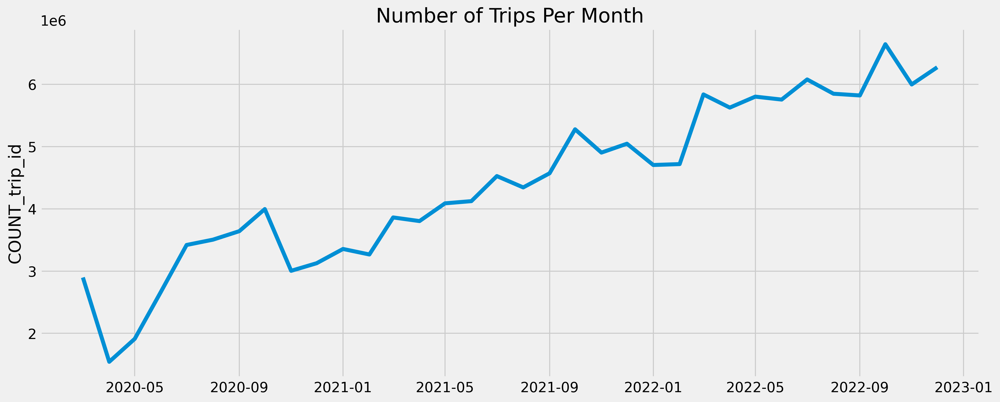

In [90]:
plot_aggregated_time_series(df ,"COUNT_trip_id", title="Number of Trips Per Month")

### Check monthly seasonality

<Axes: xlabel='trip_start_month', ylabel='COUNT_trip_id'>

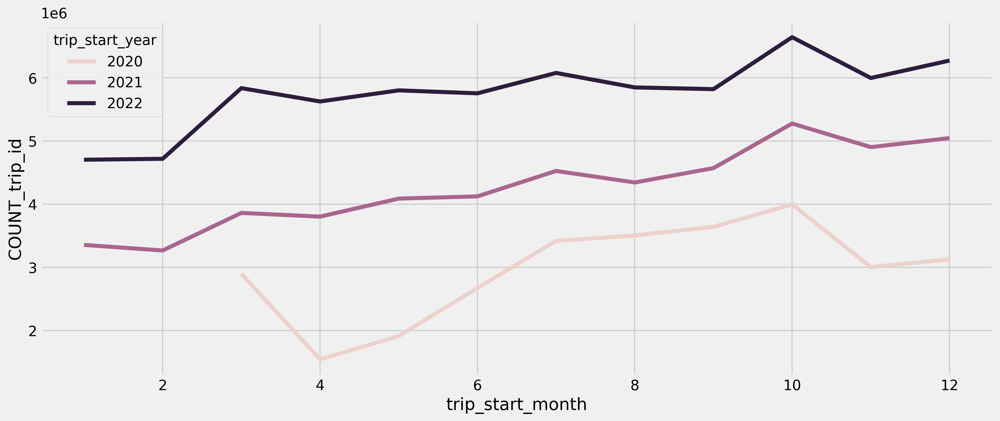

In [91]:
fig, axs = plt.subplots(1, 1, figsize=(15,6), dpi=300)
sb.lineplot(data=df, x='trip_start_month', y="COUNT_trip_id", hue="trip_start_year")

### Plot the daily number of rides for each year

In [93]:
groupby = ['trip_start_year', 'trip_start_month', "trip_start_day"]
df = group_by_datetime_cols("trip_id", groupby, conn=conn, include_week_day=True)

In [94]:
df['trip_start_day_of_week'].unique()

array([1, 2, 3, 4, 5, 6, 0])

C:\Users\armym\AppData\Local\Temp\ipykernel_5056\1259614109.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_year_day = df_year_year[df['trip_start_day_of_week'] == day_of_week]
C:\Users\armym\AppData\Local\Temp\ipykernel_5056\1259614109.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_year_day = df_year_year[df['trip_start_day_of_week'] == day_of_week]
C:\Users\armym\AppData\Local\Temp\ipykernel_5056\1259614109.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_year_day = df_year_year[df['trip_start_day_of_week'] == day_of_week]
C:\Users\armym\AppData\Local\Temp\ipykernel_5056\1259614109.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_year_day = df_year_year[df['trip_start_day_of_week'] == day_of_week]
C:\Users\armym\AppData\Local\Temp\ipykernel_5056\1259614109.py:22: UserWarning: Boolean Series key will be reindexed to match DataFr

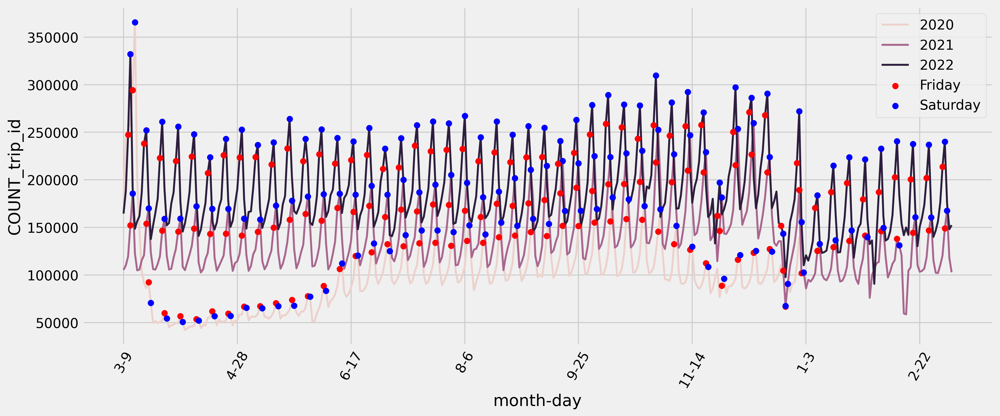

In [96]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
df['month-day'] = df['trip_start_month'].astype(str) + '-' + df['trip_start_day'].astype(str)
sb.lineplot(
    data=df, 
    x='month-day', 
    y="COUNT_trip_id", 
    hue="trip_start_year", 
    errorbar=None,
    ax=ax,
    linewidth=2
)

plt.xticks(rotation=60)


for year in [2020, 2021, 2022]:
    # Filter by year
    df_year_year = df[df['trip_start_year'] == year]
    days = zip(["red", "blue"], ["Friday", "Saturday"], [5, 6])
    for color, day_name, day_of_week in days:
        # Filter by day of week
        df_year_day = df_year_year[df['trip_start_day_of_week'] == day_of_week]
        ax.scatter(
            df_year_day['month-day'], df_year_day["COUNT_trip_id"], 
            zorder=2, 
            color=color,
            label=day_name
        )

# Remove duplicate legend labels
ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=10))
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())


# Visualize the data by pickup_community_area

In [6]:
query = """ 
SELECT DISTINCT pickup_community_area
FROM RIDES_EXTRA_VARS
"""

distinct_community_areas = conn.execute(query).fetch_df()

In [7]:
distinct_community_areas

,pickup_community_area
0,24.0
1,22.0
2,59.0
3,37.0
4,32.0
...,...
73,46.0
74,51.0
75,38.0
76,75.0


In [8]:
import matplotlib.cm as cm
colormap = cm.get_cmap("plasma", distinct_community_areas.shape[0])

C:\Users\armym\AppData\Local\Temp\ipykernel_41696\2851998619.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("plasma", distinct_community_areas.shape[0])


In [9]:
distinct_community_areas.pickup_community_area.values

array([24., 22., 59., 37., 32., 58., 55., 66., 49., 39., 63., nan, 45.,
       57., 41.,  4., 44., 25., 34., 71., 13., 26., 62., 68., 14., 40.,
       72., 20., 65., 43., 28., 16., 60., 27., 15., 30., 54., 52.,  6.,
       77., 33., 69., 56., 29., 35., 19., 64., 70., 17., 67.,  2.,  3.,
       31., 21., 53., 18., 50., 76.,  9., 61., 73.,  8.,  7.,  5., 23.,
       11., 12., 36.,  1., 42., 48., 74., 10., 46., 51., 38., 75., 47.])

In [10]:
colors = {cat: colormap(i) for i, cat in enumerate(distinct_community_areas.pickup_community_area.values)}

### Downsample by getting every 100th row

In [ ]:
query = """ 
WITH pickup_centroid_location_row AS (
    SELECT pickup_centroid_location,
    pickup_community_area,  
    row_number() over() as row
    FROM RIDES_EXTRA_VARS
)

SELECT 
    pickup_centroid_location,
    pickup_community_area
FROM pickup_centroid_location_row
WHERE row % 1000 = 0
"""

pickup_centroid_location_for_community_area = conn.execute(query).fetch_df()

In [13]:
pickup_centroid_location_for_community_area.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 2 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   pickup_centroid_location  137598 non-null  object 
 1   pickup_community_area     137295 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.3+ MB


In [14]:
# Convert the "Point(x,y)" strings to Point objects
pickup_centroid_location_for_community_area['pickup_centroid_location'] = (
    pickup_centroid_location_for_community_area['pickup_centroid_location'].apply(wkt.loads)
)

In [15]:
geodf = geopandas.GeoDataFrame(pickup_centroid_location_for_community_area, geometry='pickup_centroid_location')\
    .dropna()

In [16]:
geodf['community_color'] = geodf["pickup_community_area"].replace(colors)

In [17]:
colors = [colors[cat] for cat in geodf["pickup_community_area"].values]

### Get Chicago boundaries

In [18]:
chicago = geopandas.read_file('https://data.cityofchicago.org/resource/igwz-8jzy.geojson')
chicago = chicago.to_crs('EPSG:4326')

In [19]:
chicago

,community,shape_area,area_num_1,area_numbe,shape_len,geometry
0,ROGERS PARK,51259902.4506,1,1,34052.3975757,"MULTIPOLYGON (((-87.65456 41.99817, -87.65574 ..."
1,WEST RIDGE,98429094.8621,2,2,43020.6894583,"MULTIPOLYGON (((-87.68465 42.01948, -87.68464 ..."
2,UPTOWN,65095642.7289,3,3,46972.7945549,"MULTIPOLYGON (((-87.64102 41.9548, -87.644 41...."
3,LINCOLN SQUARE,71352328.2399,4,4,36624.6030848,"MULTIPOLYGON (((-87.67441 41.9761, -87.6744 41..."
4,NORTH CENTER,57054167.85,5,5,31391.6697542,"MULTIPOLYGON (((-87.67336 41.93234, -87.67342 ..."
...,...,...,...,...,...,...
72,WASHINGTON HEIGHTS,79635752.8769,73,73,42222.598163,"MULTIPOLYGON (((-87.63373 41.72885, -87.63369 ..."
73,MOUNT GREENWOOD,75584290.0209,74,74,48665.1305392,"MULTIPOLYGON (((-87.69646 41.70714, -87.69644 ..."
74,MORGAN PARK,91877340.6988,75,75,46396.419362,"MULTIPOLYGON (((-87.64215 41.68508, -87.64249 ..."
75,OHARE,371835607.687,76,76,173625.98466,"MULTIPOLYGON (((-87.83658 41.9864, -87.83658 4..."


### Plot the rides for each community area

<Axes: >

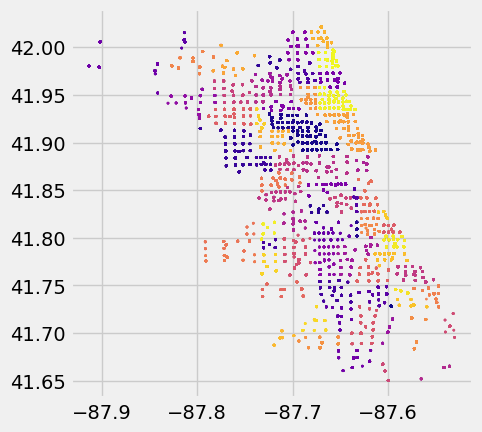

In [169]:
geodf.plot(c=colors, legend=True, markersize=2)

<GeoAxes: >

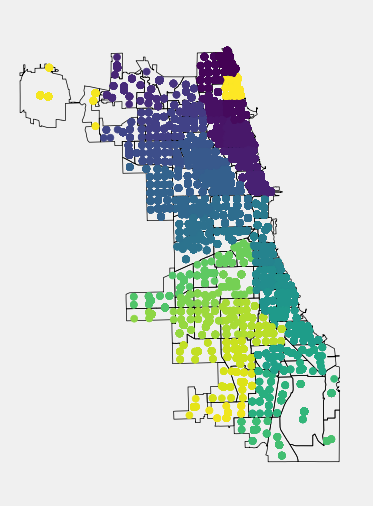

In [20]:
ax = gplt.polyplot(chicago, projection=gcrs.AlbersEqualArea())
gplt.pointplot(geodf, ax=ax, hue="pickup_community_area")

c:\Users\armym\anaconda3\envs\Fresh\Lib\site-packages\geoplot\geoplot.py:1304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(


<GeoAxes: xlabel='None', ylabel='None'>

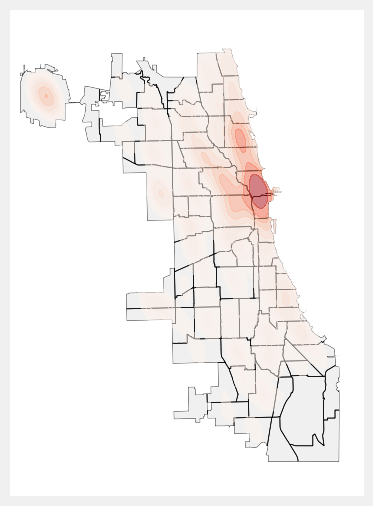

In [22]:
ax = gplt.polyplot(chicago, projection=gcrs.AlbersEqualArea())
gplt.kdeplot(geodf, cmap='Reds', shade=True, clip=chicago, ax=ax, alpha=0.5)

We see that the rides are very concentrated in the downtown area. There is also a decent amount in O'Hare part (top left corner) where the airport is

### Check impact of COVID19

In [ ]:
query = """ 
    WITH COVID AS (
        SELECT pickup_centroid_location,
        pickup_community_area,  
        row_number() over() as row
        FROM RIDES_EXTRA_VARS
        WHERE trip_start_year = 2020 and trip_start_month BETWEEN 4 AND 6
    )
    
    SELECT 
        pickup_centroid_location,
        pickup_community_area
    FROM COVID
    WHERE row % 100 = 0
"""
covid_pick_ups = conn.execute(query).fetch_df()

In [43]:
covid_pick_ups.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61285 entries, 0 to 61284
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   pickup_centroid_location  55852 non-null  object 
 1   pickup_community_area     55840 non-null  float64
dtypes: float64(1), object(1)
memory usage: 957.7+ KB


In [44]:
covid_pick_ups['pickup_centroid_location'] = (
    covid_pick_ups['pickup_centroid_location'].apply(wkt.loads)
)

geodf_covid = geopandas.GeoDataFrame(covid_pick_ups, geometry='pickup_centroid_location')\
    .dropna()

c:\Users\armym\anaconda3\envs\Fresh\Lib\site-packages\geoplot\geoplot.py:1304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(


<GeoAxes: xlabel='None', ylabel='None'>

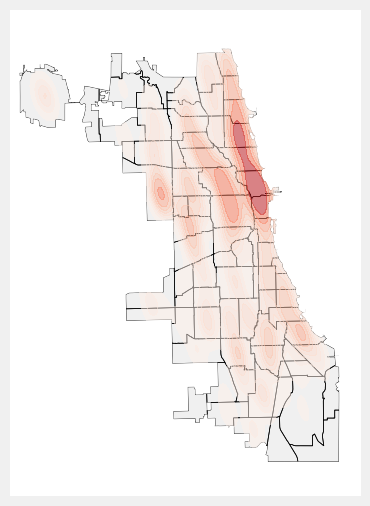

In [47]:
ax = gplt.polyplot(chicago, projection=gcrs.AlbersEqualArea())
gplt.kdeplot(geodf_covid, cmap='Reds', shade=True, clip=chicago, ax=ax, alpha=0.5)

We see that there is a reduction in trips at the airport due to reduction of travel. The density estimates also became more volatile, increasing the number of 'redder' blobs due to the reduction in rides in general

In [83]:
columns

Index(['trip_id', 'trip_start_timestamp', 'trip_end_timestamp', 'trip_seconds',
       'trip_miles', 'pickup_census_tract', 'dropoff_census_tract',
       'pickup_community_area', 'dropoff_community_area', 'fare', 'tip',
       'additional_charges', 'trip_total', 'shared_trip_authorized',
       'trips_pooled', 'pickup_centroid_latitude', 'pickup_centroid_longitude',
       'pickup_centroid_location', 'dropoff_centroid_latitude',
       'dropoff_centroid_longitude', 'dropoff_centroid_location',
       'trip_start_year', 'trip_start_month', 'trip_start_day',
       'trip_start_day_of_week', 'trip_start_hour'],
      dtype='object')

In [ ]:
def count_trips_per_group(group):
    query = f"""
    SELECT {group}, COUNT(trip_id) as num_trips
    FROM RIDES_EXTRA_VARS 
    GROUP BY {group}
    """
    count_per_group = conn.execute(query)\
        .fetch_df()\
        .sort_values(by="num_trips", ascending=False)\
        .set_index(group)\

    return count_per_group

### Plot most number of pick ups and dropoffs for each area (nan outside of Chicago)

Text(0, 0.5, 'Number of trips')

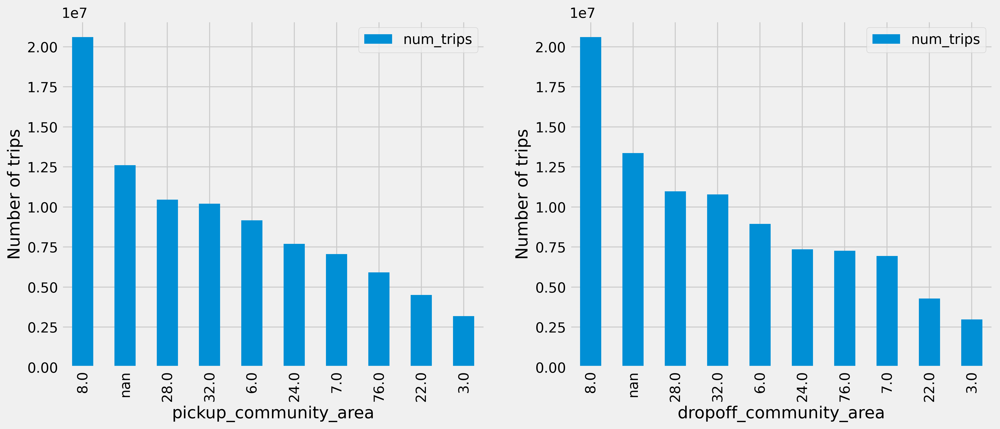

In [33]:
count_by_pickup_community_area = count_trips_per_group("pickup_community_area")
count_by_dropoff_community_area = count_trips_per_group("dropoff_community_area")

fig, ax = plt.subplots(1, 2, figsize=(15,6), dpi=300)
count_by_pickup_community_area.iloc[:10].plot(kind='bar', ax=ax[0])
count_by_dropoff_community_area.iloc[:10].plot(kind='bar', ax=ax[1])

plt.xticks(rotation=90)
ax[1].set_ylabel("Number of trips")
ax[0].set_ylabel("Number of trips")

### See which communities pickups from 8.0 are most dropped off at

In [148]:
query = """
    SELECT dropoff_community_area, COUNT(trip_id) as num_trips
    FROM RIDES_EXTRA_VARS 
    WHERE pickup_community_area = 8.0
    GROUP BY dropoff_community_area
"""

df = fetch_df_from_query(query)\
    .set_index("dropoff_community_area")\
    .sort_values(by="num_trips", ascending=False)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '8.0'),
  Text(1, 0, '32.0'),
  Text(2, 0, '28.0'),
  Text(3, 0, '7.0'),
  Text(4, 0, '6.0'),
  Text(5, 0, '24.0'),
  Text(6, 0, '76.0'),
  Text(7, 0, 'nan'),
  Text(8, 0, '33.0'),
  Text(9, 0, '22.0')])

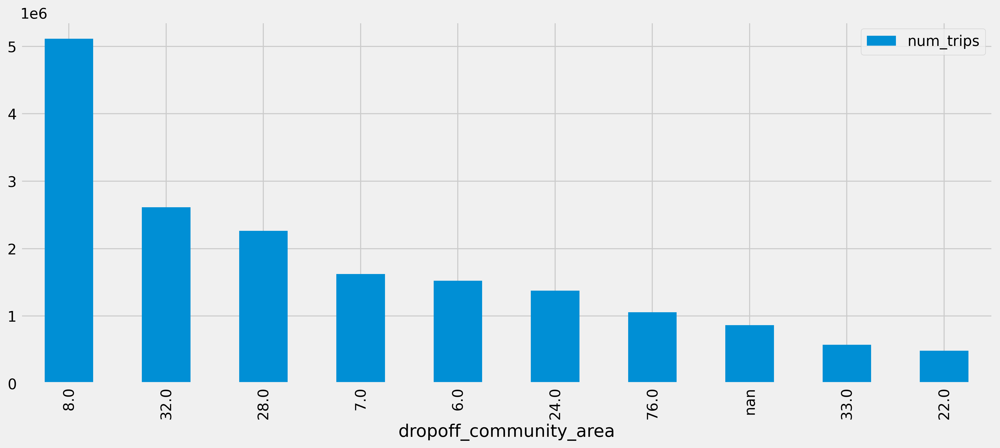

In [150]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
df.iloc[:10].plot(kind='bar', ax=ax)
plt.xticks(rotation=90)

So the majority of pick-ups are dropped off in 8.0 again and then 32 which is directly south below 8.0. 28 is then West of 32 (directly beside 32).  These drop off locations are pretty much directly beside 8.0 while 22 is the furthest

Community: https://en.wikipedia.org/wiki/File:Chicago_Community_Areas.svg

# Rides over time for Community areas

In [ ]:
groups = ['pickup_community_area', 'trip_start_year', 'trip_start_month', 'trip_start_day']
df = group_by_datetime_cols("trip_id", groups, conn)
df = create_date_from_year_month(df, 'trip_start_year', 'trip_start_month', 'trip_start_day')

Text(0.5, 1.0, 'Number of Rides For Community Areas')

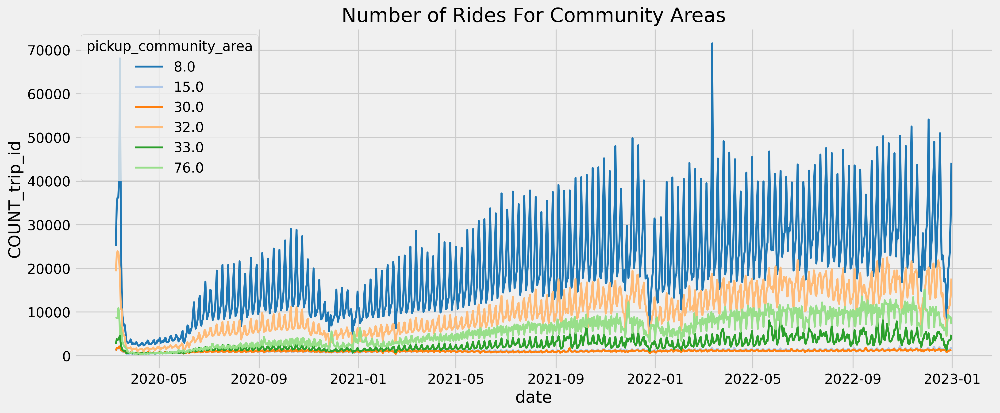

In [24]:
community_areas = [15, 30, 32, 33, 76, 8]

fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
df_filtered = df[df['pickup_community_area'].isin(community_areas)]

sb.lineplot(
    data=df_filtered, 
    x='date', 
    y="COUNT_trip_id", 
    hue="pickup_community_area", 
    errorbar=None,
    ax=ax,
    linewidth=2,
    palette='tab20'
)

plt.title("Number of Rides For Community Areas")

### Differenced

Text(0.5, 1.0, 'Number of Rides For Community Areas')

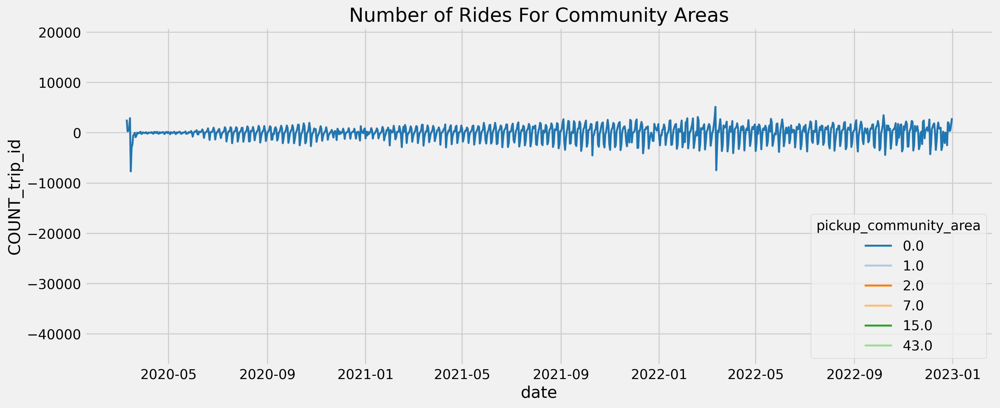

In [25]:

fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
df_filtered = df[df['pickup_community_area'].isin(community_areas)]\
    .set_index('date')\
    .diff().dropna()

sb.lineplot(
    data=df_filtered, 
    x='date', 
    y="COUNT_trip_id", 
    hue="pickup_community_area", 
    errorbar=None,
    ax=ax,
    linewidth=2,
    palette='tab20'
)

plt.title("Number of Rides For Community Areas")

### Aggregate to 30 minute intervals

In [13]:
query = """ 
 SELECT 
    pickup_community_area,
    time_bucket(INTERVAL '30 minutes', trip_start_timestamp) as interval,
    count(trip_id) as num_rides,
    AVG(fare) as average_fare,
    AVG(trip_total) as average_trip_total,
    MAX(trip_start_day_of_week) as trip_start_day_of_week,
    MAX(trip_start_hour) as trip_start_hour
FROM RIDES_EXTRA_VARS
GROUP BY pickup_community_area, interval
"""

df_30_min = fetch_df_from_query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

<Axes: xlabel='interval', ylabel='num_rides'>

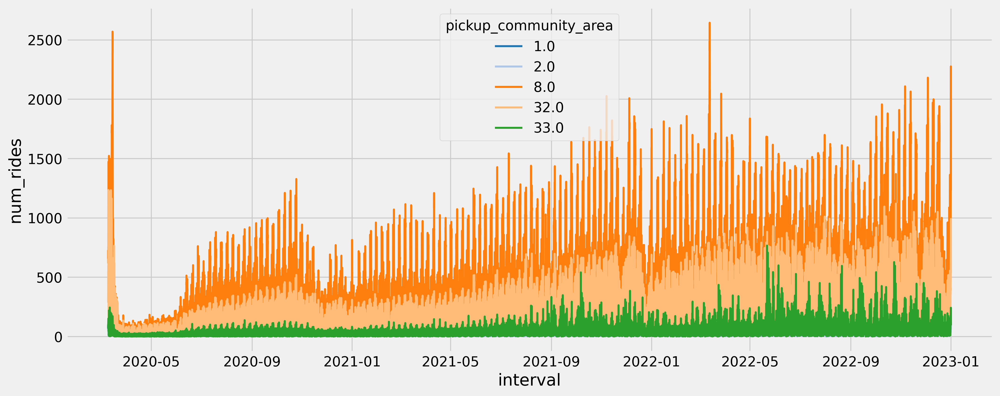

In [10]:
communities_subset = [8, 32, 33, 1, 2]

df_30_min_sub = df_30_min[df_30_min['pickup_community_area'].isin(communities_subset)]

fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
sb.lineplot(
    data=df_30_min_sub, 
    x='interval', 
    y="num_rides",
    hue="pickup_community_area", 
    errorbar=None,
    ax=ax,
    linewidth=2,
    palette='tab20'
)

### Aggregate values to hour-minute for each day of the week

In [62]:
query = """ 
 SELECT 
    pickup_community_area,
    time_bucket(INTERVAL '30 minutes', trip_start_timestamp) as interval,
    count(trip_id) as num_rides,
    AVG(fare) as average_fare,
    AVG(trip_total) as average_trip_total,
    MAX(trip_start_day_of_week) as trip_start_day_of_week,
    MAX(trip_start_hour) as trip_start_hour
FROM RIDES_EXTRA_VARS
GROUP BY pickup_community_area, interval
"""

In [63]:
query2 = f""" 
 WITH agg AS ({query}),

 time_vars AS (
    SELECT 
        HOUR(interval) AS hour,
        MINUTE(interval) AS minute,
        num_rides,
        average_fare,
        average_trip_total,
        trip_start_day_of_week,
        trip_start_hour
    FROM agg
)

SELECT 
    hour,
    minute,
    CONCAT(hour, '-', minute) as hour_minute,
    count(num_rides) as num_rides,
    AVG(average_fare) as average_fare,
    AVG(average_trip_total) as average_trip_total,
    MAX(trip_start_day_of_week) as trip_start_day_of_week,
    MAX(trip_start_hour) as trip_start_hour
FROM time_vars
GROUP BY trip_start_day_of_week, hour, minute
"""

df_30_min_week_day = fetch_df_from_query(query2)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

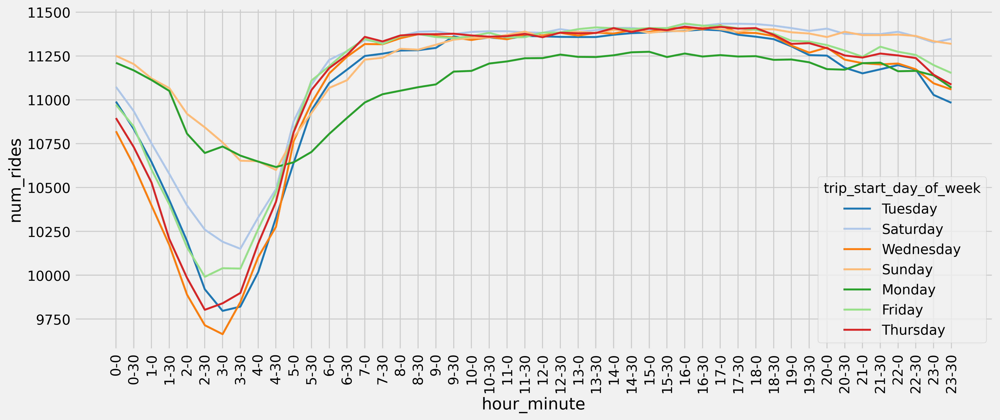

In [ ]:
df_30_min_week_day_sub = df_30_min_week_day.sort_values(by=['hour', 'minute'])
df_30_min_week_day_sub['trip_start_day_of_week'] = df_30_min_week_day_sub['trip_start_day_of_week'].replace(DAY_OF_WEEK_MAP)

fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)

sb.lineplot(
    data=df_30_min_week_day_sub, 
    x='hour_minute', 
    y="num_rides",
    hue="trip_start_day_of_week", 
    errorbar=None,
    ax=ax,
    linewidth=2,
    palette='tab20'
)

_ = plt.xticks(rotation=90)

# Correlation Between Commuinity Areas For Pickups 

### Seasonally adjust and difference data to avoid spurious correlations

In [26]:
# Make each pickup_community_area a column
# We difference to avoid spurious correlations
df_pivoted = df.pivot(
    index='date', 
    columns=['pickup_community_area'], 
    values='COUNT_trip_id'
)

In [27]:
from statsmodels.tsa.seasonal import seasonal_decompose

communities = {}
for col in df_pivoted.columns:
    decomp = seasonal_decompose(
        df_pivoted[col].dropna(),
        model="multiplicative",
        period=7
    )
    adjusted = df_pivoted[col] / decomp.seasonal
    
    communities[col] = adjusted

df_adjusted = pd.DataFrame(communities, index=df_pivoted.index).diff()


In [28]:
df_adjusted.head()

,NaN,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0
date,,,,,,,,,,,,,,,,,,,,,
2020-03-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-10,5606.439394,948.191174,910.314466,2007.640211,667.121496,740.731934,5169.175105,4662.022136,10917.010389,59.286238,...,308.623657,565.314765,259.654018,568.500979,113.185337,315.547341,84.593544,197.474311,1570.910915,917.835407
2020-03-11,-777.111336,-242.732065,-260.956546,-663.250180,-114.587017,8.774751,-1094.173497,-1741.295080,-2582.510166,16.293283,...,12.884966,-91.489708,-17.300536,-55.937507,22.447695,-50.001066,-14.714399,-60.507482,210.099209,-135.094018
2020-03-12,-852.980797,19.802115,-157.738886,-246.431297,-208.821980,-288.231828,-635.426086,-718.584794,-4338.429611,-7.425914,...,-144.855543,41.683840,-41.020376,36.305281,-76.812134,32.493608,5.764990,-7.902203,1326.763092,-11.040007
2020-03-13,-901.401917,153.557345,22.812611,-113.248560,-89.175104,-225.147724,387.134098,-437.299079,-4145.524638,-41.106511,...,84.709523,92.018471,7.898981,56.562999,42.127118,28.698585,-0.974139,69.045422,-1548.832110,16.981526


### Plot some of the adjusted data

<Axes: xlabel='date'>

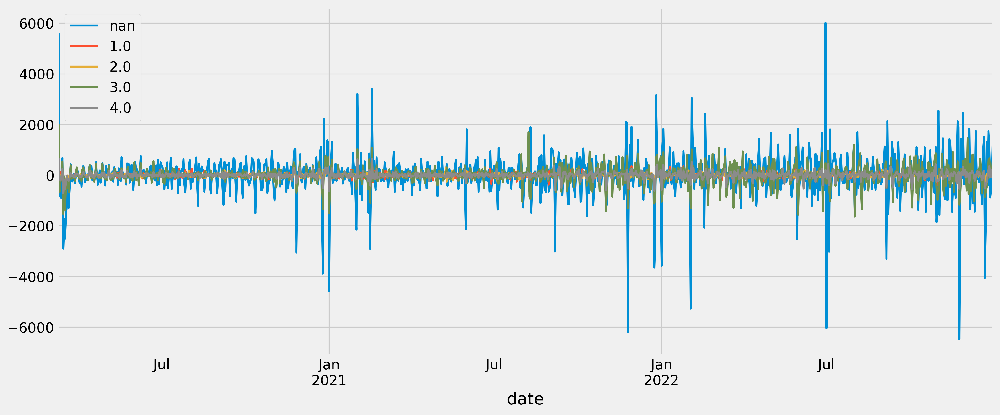

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
df_adjusted.iloc[:, :5].plot(linewidth=2, ax=ax)

### Correlation of pickups between each community area (Adjusted)

In [30]:
corr = df_adjusted.corr()

(array([ 0.5,  4.5,  8.5, 12.5, 16.5, 20.5, 24.5, 28.5, 32.5, 36.5, 40.5,
        44.5, 48.5, 52.5, 56.5, 60.5, 64.5, 68.5, 72.5, 76.5]),
 [Text(0, 0.5, 'nan'),
  Text(0, 4.5, '4.0'),
  Text(0, 8.5, '8.0'),
  Text(0, 12.5, '12.0'),
  Text(0, 16.5, '16.0'),
  Text(0, 20.5, '20.0'),
  Text(0, 24.5, '24.0'),
  Text(0, 28.5, '28.0'),
  Text(0, 32.5, '32.0'),
  Text(0, 36.5, '36.0'),
  Text(0, 40.5, '40.0'),
  Text(0, 44.5, '44.0'),
  Text(0, 48.5, '48.0'),
  Text(0, 52.5, '52.0'),
  Text(0, 56.5, '56.0'),
  Text(0, 60.5, '60.0'),
  Text(0, 64.5, '64.0'),
  Text(0, 68.5, '68.0'),
  Text(0, 72.5, '72.0'),
  Text(0, 76.5, '76.0')])

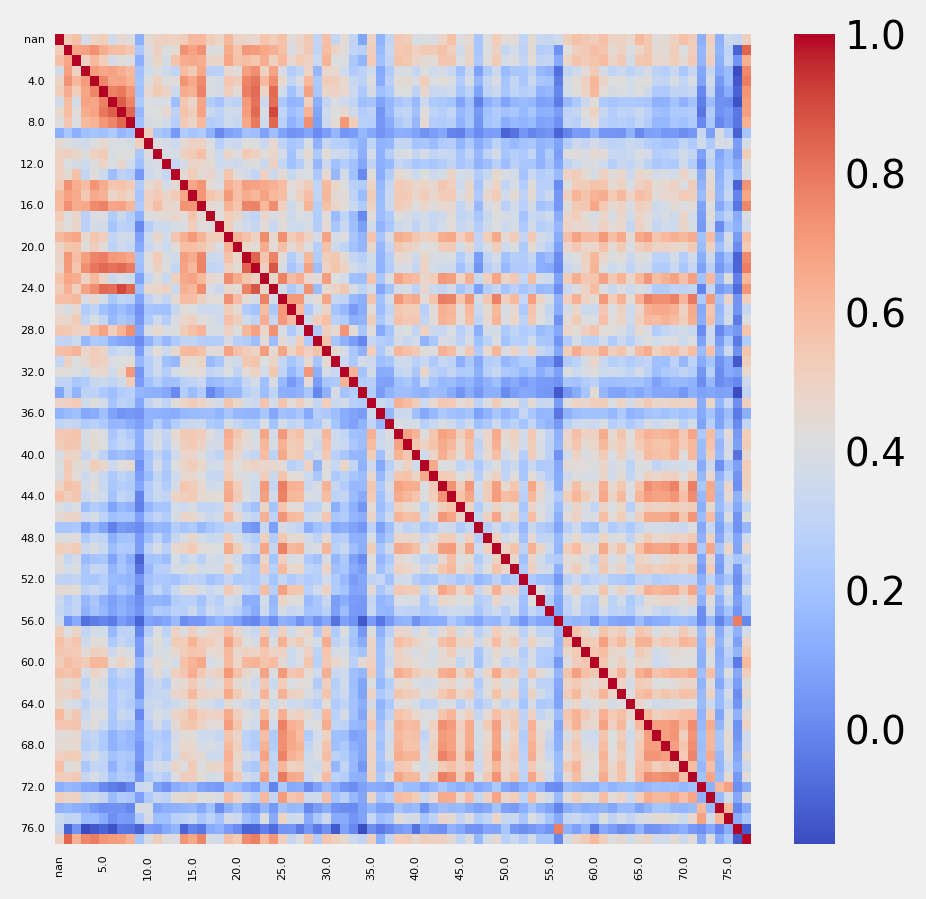

In [247]:
fig, ax = plt.subplots(1, 1, figsize=(5,5), dpi=200)
sb.heatmap(corr, ax=ax, cmap='coolwarm')
plt.xticks(fontsize=4)
plt.yticks(fontsize=4)

### Spatial autocorrelation for ride counts

In [ ]:
from libpysal.weights import Queen
from esda.moran import Moran

def remove_decimal(x):
    if x:
        x = x.replace(".0", "")
    return x

def convert_community_area_to_int(df):
    df['pickup_community_area'] = (
        df['pickup_community_area']\
            .astype(str)\
            .apply(lambda x: remove_decimal(x))
    )
    return df

count_by_pickup_community_area_geo = convert_community_area_to_int(count_by_pickup_community_area.reset_index())

# Merge with the Chicago geo data
count_by_pickup_community_area_geo = count_by_pickup_community_area_geo.merge(chicago, left_on="pickup_community_area", right_on="area_num_1")

In [43]:
count_by_pickup_community_area_geo

,pickup_community_area,num_trips,community,shape_area,area_num_1,area_numbe,shape_len,geometry
0,8,20596874,NEAR NORTH SIDE,76675895.9728,8,8,57293.1649516,"MULTIPOLYGON (((-87.62446 41.91157, -87.62459 ..."
1,28,10459624,NEAR WEST SIDE,158492466.554,28,28,53003.5929406,"MULTIPOLYGON (((-87.63759 41.88623, -87.63765 ..."
2,32,10201041,LOOP,46335565.4586,32,32,39428.6729962,"MULTIPOLYGON (((-87.60949 41.8894, -87.60949 4..."
3,6,9164986,LAKE VIEW,87214799.2728,6,6,51973.0968677,"MULTIPOLYGON (((-87.64102 41.9548, -87.64101 4..."
4,24,7701123,WEST TOWN,127562904.597,24,24,55203.7186956,"MULTIPOLYGON (((-87.65686 41.91078, -87.65685 ..."
...,...,...,...,...,...,...,...,...
72,37,135898,FULLER PARK,19916704.8692,37,37,25339.0897503,"MULTIPOLYGON (((-87.6288 41.80189, -87.62879 4..."
73,74,131410,MOUNT GREENWOOD,75584290.0209,74,74,48665.1305392,"MULTIPOLYGON (((-87.69646 41.70714, -87.69644 ..."
74,52,97713,EAST SIDE,83241728.0493,52,52,52274.1928493,"MULTIPOLYGON (((-87.52462 41.6918, -87.52501 4..."
75,47,88483,BURNSIDE,16995983.2737,47,47,18137.9442529,"MULTIPOLYGON (((-87.58737 41.72326, -87.58733 ..."


In [121]:
count_by_pickup_community_area_geodf = geopandas.GeoDataFrame(count_by_pickup_community_area_geo, geometry="geometry")

In [ ]:
count_by_pickup_community_area_geodf_ = count_by_pickup_community_area_geodf[["num_trips", "geometry"]]

In [ ]:
w = Queen.from_dataframe(count_by_pickup_community_area_geodf_)
w.transform = 'R'

moran = Moran(count_by_pickup_community_area_geodf_["num_trips"], w)


C:\Users\armym\AppData\Local\Temp\ipykernel_41696\959139600.py:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(count_by_pickup_community_area_geodf)


In [49]:
print("Moran I:", moran.I)
print("P-value::", moran.p_sim)

Moran I: 0.5290817817263986
P-value:: 0.001


# Fares + Other Expenses

## Fare amount for each community

In [ ]:
query = """
    SELECT
        pickup_community_area, 
        AVG(fare / trip_miles) as avg_fare_per_mile,
        AVG(fare / (trip_seconds / 60)) as avg_fare_per_minute
    FROM RIDES_EXTRA_VARS
    WHERE fare > 0 AND trip_miles > 0 AND trip_seconds > 0
    GROUP BY pickup_community_area
"""

average_fares_df = fetch_df_from_query(query)

In [54]:
average_fares_df = convert_community_area_to_int(average_fares_df)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77]),
 [Text(0, 0, '43'),
  Text(1, 0, '8'),
  Text(2, 0, '32'),
  Text(3, 0, '27'),
  Text(4, 0, '45'),
  Text(5, 0, '28'),
  Text(6, 0, '41'),
  Text(7, 0, '6'),
  Text(8, 0, '33'),
  Text(9, 0, '7'),
  Text(10, 0, '31'),
  Text(11, 0, '24'),
  Text(12, 0, '42'),
  Text(13, 0, '36'),
  Text(14, 0, '34'),
  Text(15, 0, '37'),
  Text(16, 0, '22'),
  Text(17, 0, '9'),
  Text(18, 0, '65'),
  Text(19, 0, '23'),
  Text(20, 0, '38'),
  Text(21, 0, '35'),
  Text(22, 0, '72'),
  Text(23, 0, '5'),
  Text(24, 0, '39'),
  Text(25, 0, '40'),
  Text(26, 0, '48'),
  Text(27, 0, '3'),
  Text(28, 0, '29'),
  Text(29, 0, '73'),
  Text(30, 0, '75'),
  Text(31, 

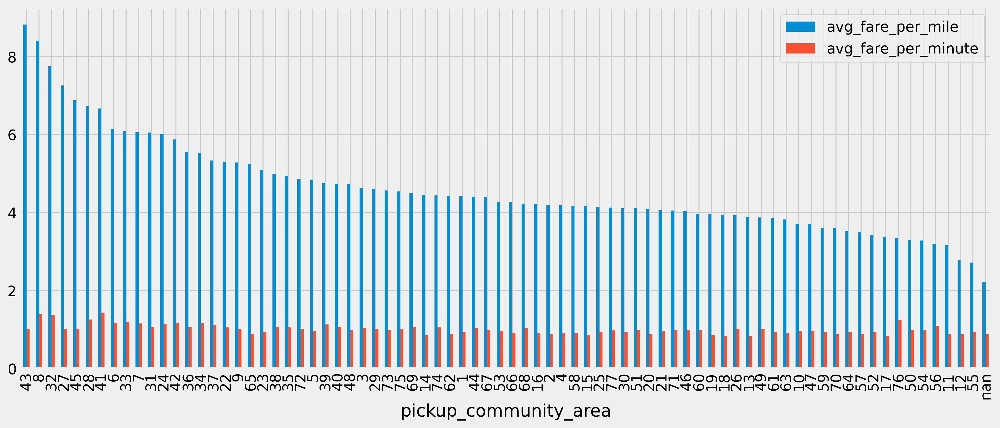

In [55]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
average_fares_df.sort_values(by="avg_fare_per_mile", ascending=False)\
    .set_index("pickup_community_area")\
    .plot(kind='bar', ax=ax)

plt.xticks(rotation=90)

In [56]:
chicago_and_fares = chicago.merge(average_fares_df, left_on="area_num_1", right_on="pickup_community_area")

### Fare per-mile

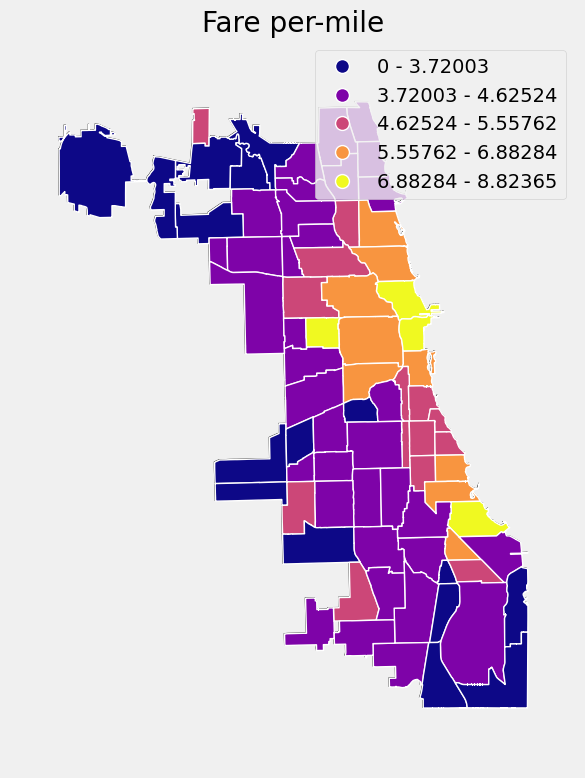

In [57]:
ax = gplt.polyplot(
    chicago_and_fares, projection=gcrs.AlbersEqualArea(),
    figsize=(8,8)
)
gplt.choropleth(
  chicago_and_fares,
  hue="avg_fare_per_mile",
  edgecolor="white",
  linewidth=1,
  cmap="plasma",
  legend=True,
  scheme="FisherJenks",
  projection=gcrs.AlbersEqualArea(),
  ax=ax
)

ax.set_title("Fare per-mile")
plt.tight_layout()

### Fare per-minute

c:\Users\armym\anaconda3\envs\Fresh\Lib\site-packages\geoplot\geoplot.py:966: UserWarning: Numba not installed. Using slow pure python version.
  self.set_hue_values(color_kwarg=None, default_color=None)


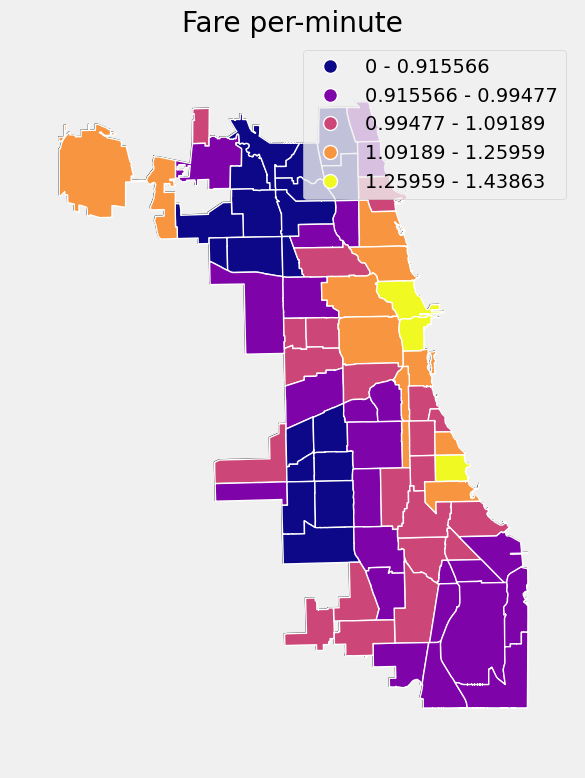

In [299]:
ax = gplt.polyplot(
    chicago_and_fares, projection=gcrs.AlbersEqualArea(),
    figsize=(8,8)
)
gplt.choropleth(
  chicago_and_fares,
  hue="avg_fare_per_minute",
  edgecolor="white",
  linewidth=1,
  cmap="plasma",
  legend=True,
  scheme="FisherJenks",
  projection=gcrs.AlbersEqualArea(),
  ax=ax
)
ax.set_title("Fare per-minute")
plt.tight_layout()

In [305]:
columns

Index(['trip_id', 'trip_start_timestamp', 'trip_end_timestamp', 'trip_seconds',
       'trip_miles', 'pickup_census_tract', 'dropoff_census_tract',
       'pickup_community_area', 'dropoff_community_area', 'fare', 'tip',
       'additional_charges', 'trip_total', 'shared_trip_authorized',
       'trips_pooled', 'pickup_centroid_latitude', 'pickup_centroid_longitude',
       'pickup_centroid_location', 'dropoff_centroid_latitude',
       'dropoff_centroid_longitude', 'dropoff_centroid_location',
       'trip_start_year', 'trip_start_month', 'trip_start_day',
       'trip_start_day_of_week', 'trip_start_hour'],
      dtype='object')

In [316]:
query = """
    SELECT
        trip_start_year, 
        trip_start_month, 
        AVG(fare / trip_miles) as avg_fare_per_mile,
        AVG(fare / (trip_seconds / 60)) as avg_fare_per_minute,
        AVG(fare) as avg_fare
    FROM RIDES_EXTRA_VARS
    WHERE fare > 0 AND trip_miles > 0 AND trip_seconds > 0
    GROUP BY trip_start_year, trip_start_month
"""

fares_per_year_month = fetch_df_from_query(query)

In [317]:
fares_per_year_month = create_date_from_year_month(fares_per_year_month, "trip_start_year", "trip_start_month")

In [318]:
fares_per_year_month = fares_per_year_month.set_index("date")
fares_per_year_month

,trip_start_year,trip_start_month,avg_fare_per_mile,avg_fare_per_minute,avg_fare
date,,,,,
2020-03-01,2020,3,3.399560,0.750634,11.120308
2020-04-01,2020,4,3.011283,0.779286,10.863873
2020-05-01,2020,5,2.840618,0.763665,11.491678
2020-06-01,2020,6,3.394441,0.766567,12.008516
2020-07-01,2020,7,3.605919,0.772198,11.982667
2020-08-01,2020,8,3.702383,0.843982,12.960020
2020-09-01,2020,9,5.682212,0.838358,13.069199
2020-10-01,2020,10,3.270716,0.833966,12.718562
2020-11-01,2020,11,3.130139,0.832659,12.366051


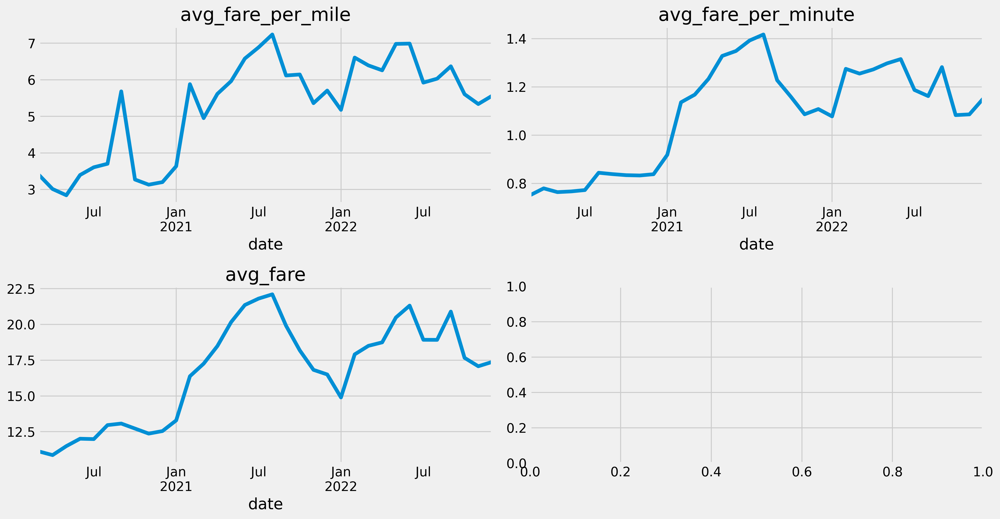

In [328]:
fig, ax = plt.subplots(2, 2, figsize=(15,8), dpi=300)
fares_per_year_month['avg_fare_per_mile'].plot(
    ax=ax[0][0], title='avg_fare_per_mile'
)
fares_per_year_month['avg_fare_per_minute'].plot(
    ax=ax[0][1], title='avg_fare_per_minute'
)
fares_per_year_month['avg_fare'].plot(
    ax=ax[1][0], title='avg_fare'
)
plt.tight_layout()

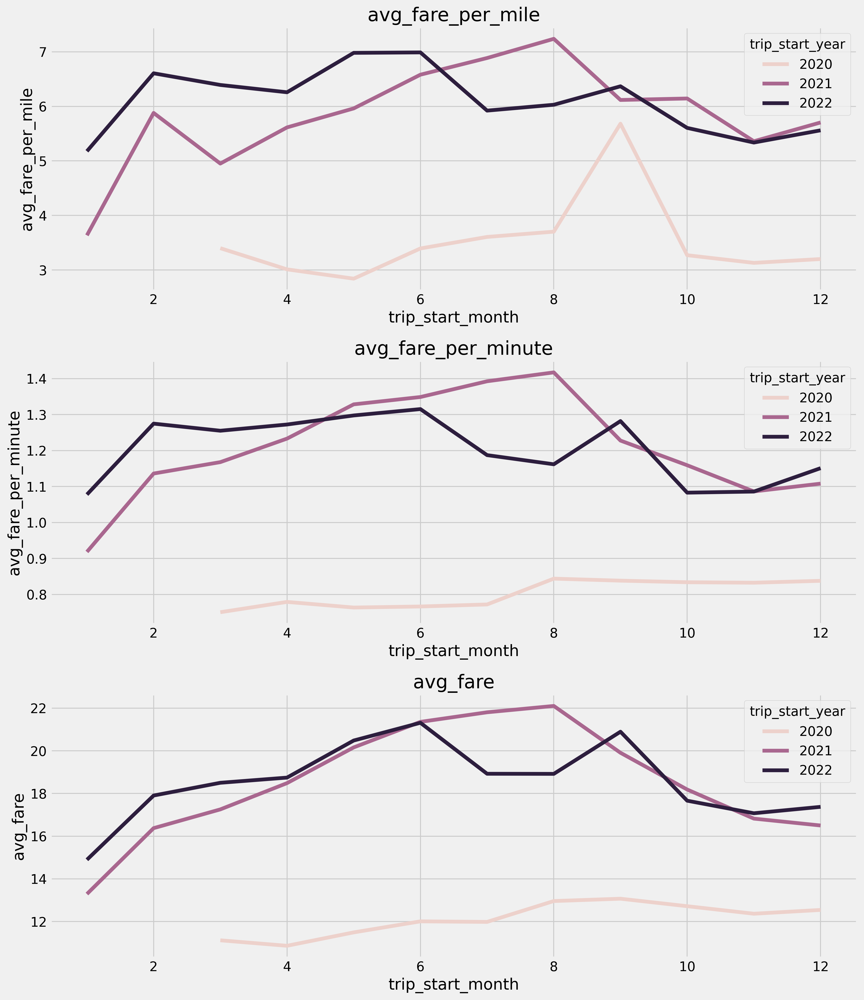

In [339]:
fig, ax = plt.subplots(3, 1, figsize=(13,15), dpi=300)
for i, var in enumerate(['avg_fare_per_mile', 'avg_fare_per_minute', 'avg_fare']):
    sb.lineplot(
        data=fares_per_year_month, 
        x='trip_start_month', 
        y=var, 
        hue="trip_start_year",
        ax=ax[i]
    )
    ax[i].set_title(var)
plt.tight_layout()

In [340]:
query = """
    SELECT
        trip_start_year, 
        trip_start_month, 
        AVG(fare) as avg_fare
    FROM RIDES_EXTRA_VARS
    WHERE fare > 0
    GROUP BY trip_start_year, trip_start_month
"""

fares_per_year_month = fetch_df_from_query(query)

In [341]:
fares_per_year_month = create_date_from_year_month(fares_per_year_month, "trip_start_year", "trip_start_month")

<Axes: >

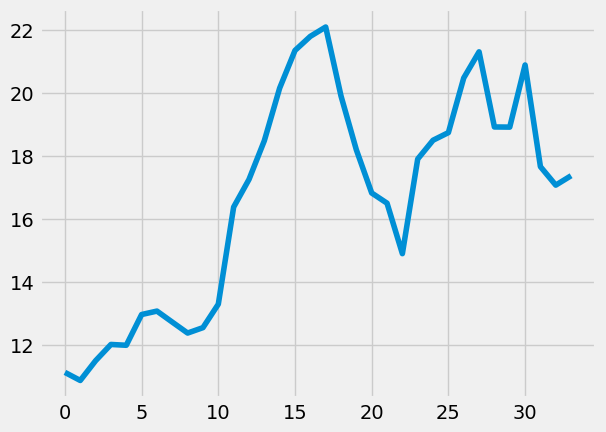

In [342]:
fares_per_year_month['avg_fare'].plot()

The average fares in 2021 and 2022 share similar patterns

In [343]:
columns

Index(['trip_id', 'trip_start_timestamp', 'trip_end_timestamp', 'trip_seconds',
       'trip_miles', 'pickup_census_tract', 'dropoff_census_tract',
       'pickup_community_area', 'dropoff_community_area', 'fare', 'tip',
       'additional_charges', 'trip_total', 'shared_trip_authorized',
       'trips_pooled', 'pickup_centroid_latitude', 'pickup_centroid_longitude',
       'pickup_centroid_location', 'dropoff_centroid_latitude',
       'dropoff_centroid_longitude', 'dropoff_centroid_location',
       'trip_start_year', 'trip_start_month', 'trip_start_day',
       'trip_start_day_of_week', 'trip_start_hour'],
      dtype='object')

### Fares for each week day

In [362]:
query = """
    SELECT
        trip_start_day_of_week,
        count(trip_start_day_of_week) as count_trip_start_day_of_week,
        AVG(fare / trip_miles) as avg_fare_per_mile,
        stddev(fare / trip_miles) as std_fare_per_mile,
        AVG(fare / (trip_seconds / 60)) as avg_fare_per_minute,
        stddev(fare / trip_seconds) as std_fare_per_minute,
        AVG(fare) as avg_fare,
        stddev(fare) as std_fare
    FROM RIDES_EXTRA_VARS
    WHERE fare > 0 AND trip_miles > 0 AND trip_seconds > 0
    GROUP BY trip_start_day_of_week
"""

fares_per_week_day = fetch_df_from_query(query)\
    .set_index("trip_start_day_of_week")\
    .sort_index()

<Axes: title={'center': 'Average Fares for Each Week Day'}, xlabel='trip_start_day_of_week'>

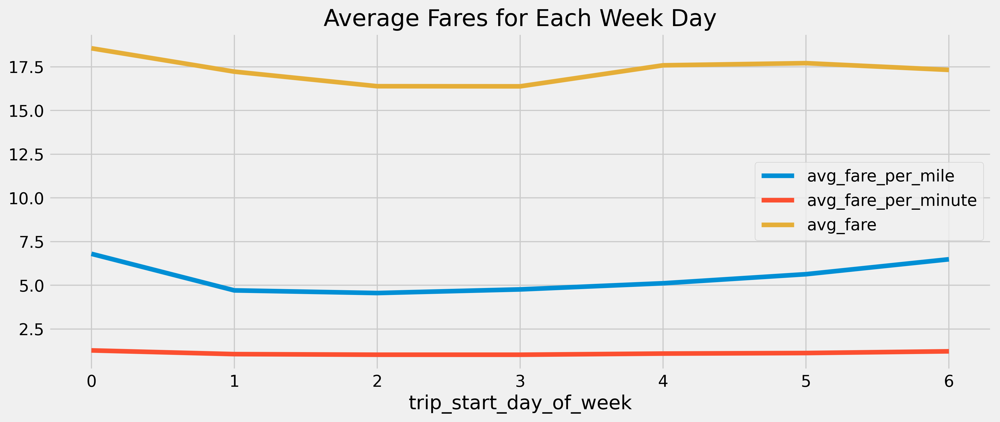

In [359]:
fig, ax = plt.subplots(1, 1, figsize=(13,5), dpi=300)
fares_per_week_day[["avg_fare_per_mile", "avg_fare_per_minute", "avg_fare"]]\
    .plot(title="Average Fares for Each Week Day", ax=ax)


In [360]:
fares_per_week_day.columns

Index(['avg_fare_per_mile', 'std_fare_per_mile', 'avg_fare_per_minute',
       'std_fare_per_minute', 'avg_fare', 'std_fare'],
      dtype='object')

In [361]:
fares_per_week_day[['std_fare_per_mile', 'std_fare_per_minute', 'std_fare']]

,std_fare_per_mile,std_fare_per_minute,std_fare
trip_start_day_of_week,,,
0,1704.883064,0.045571,14.807406
1,656.502012,0.034656,13.980555
2,256.977932,0.033437,12.821918
3,317.023863,0.036891,12.602384
4,242.048969,0.034667,13.707574
5,252.541189,0.037343,13.720264
6,399.700266,0.036537,12.793853


## Fares daily

In [ ]:
query = """
    SELECT
        trip_start_year, 
        trip_start_month, 
        trip_start_day,
        AVG(fare / trip_miles) as avg_fare_per_mile,
        AVG(fare / (trip_seconds / 60)) as avg_fare_per_minute,
        AVG(fare) as avg_fare
    FROM RIDES_EXTRA_VARS
    WHERE fare > 0 AND trip_miles > 0 AND trip_seconds > 0
    GROUP BY trip_start_year, trip_start_month, trip_start_day
"""

fares_per_year_month_day = fetch_df_from_query(query)

### Fares for hour-30-minute interval for each day of the week

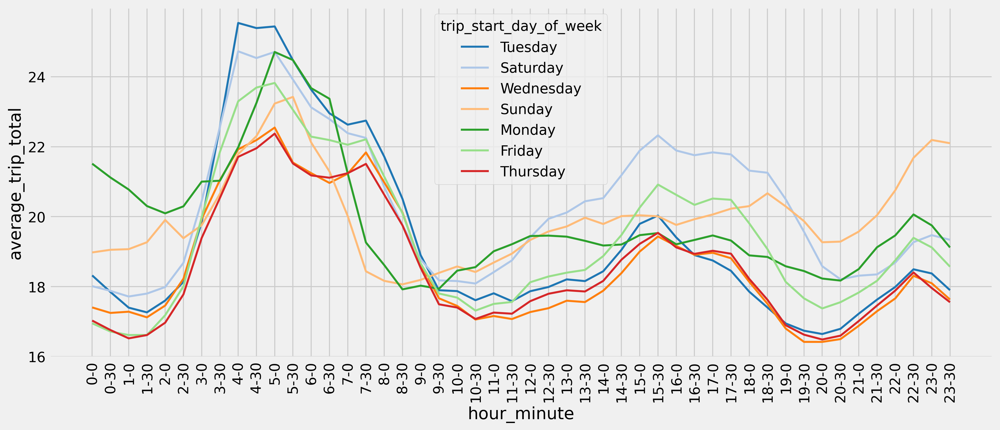

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
sb.lineplot(
    data=df_30_min_week_day_sub, 
    x='hour_minute', 
    y="average_trip_total",
    hue="trip_start_day_of_week", 
    errorbar=None,
    ax=ax,
    linewidth=2,
    palette='tab20'
)

_ = plt.xticks(rotation=90)

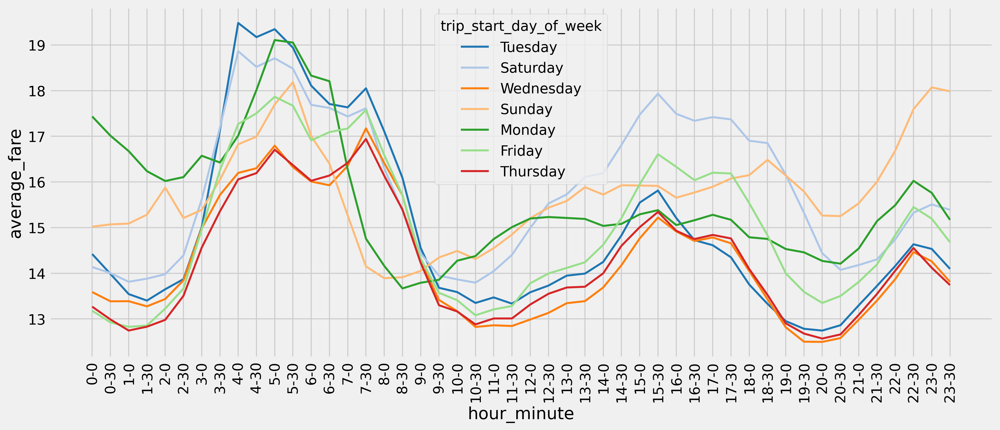

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
sb.lineplot(
    data=df_30_min_week_day_sub, 
    x='hour_minute', 
    y="average_fare",
    hue="trip_start_day_of_week", 
    errorbar=None,
    ax=ax,
    linewidth=2,
    palette='tab20'
)

_ = plt.xticks(rotation=90)

## Which community tips the most

In [ ]:
query = """
    SELECT
        pickup_community_area, 
        AVG(tip) as avg_tip
    FROM RIDES_EXTRA_VARS
    GROUP BY pickup_community_area
"""

avg_tips = fetch_df_from_query(query)


In [61]:
avg_tips = convert_community_area_to_int(avg_tips)

In [62]:
chicago_and_avg_tips = chicago.merge(avg_tips, left_on="area_num_1", right_on="pickup_community_area")

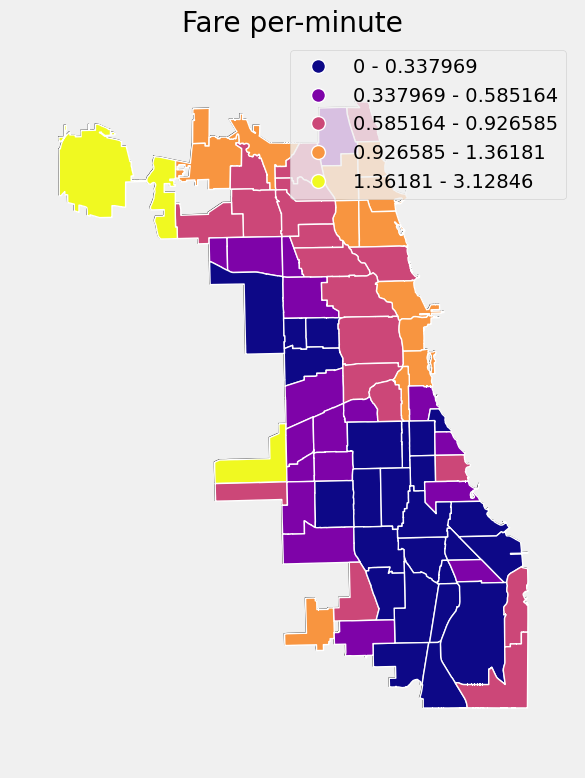

In [63]:
ax = gplt.polyplot(
    chicago_and_avg_tips, projection=gcrs.AlbersEqualArea(),
    figsize=(8,8)
)
gplt.choropleth(
  chicago_and_avg_tips,
  hue="avg_tip",
  edgecolor="white",
  linewidth=1,
  cmap="plasma",
  legend=True,
  scheme="FisherJenks",
  projection=gcrs.AlbersEqualArea(),
  ax=ax
)
ax.set_title("Fare per-minute")
plt.tight_layout()

# Weather patterns

In [270]:
from meteostat import Point, Daily, Hourly
from datetime import datetime

start = datetime(2020, 1, 1)
end = datetime(2023, 2, 1)
location = Point(41.8667, -87.6, 181)

In [ ]:
data = Hourly(location, start, end)
data = data.fetch()

In [ ]:
data.to_csv("./weatherdata/weather.csv")

In [69]:
weather = pd.read_csv("./weatherdata/weather.csv")

In [70]:
weather = weather.dropna(axis=1, thresh=0.8*weather.shape[0])

In [71]:
weather['time'] = pd.to_datetime(weather['time'])

In [72]:
weather.head()

,time,temp,dwpt,rhum,prcp,wdir,wspd,pres,coco
0,2020-01-01 00:00:00,-2.0,-6.0,74.0,NaN,280.0,24.0,1009.8,3.0
1,2020-01-01 01:00:00,-1.7,-6.1,72.0,0.0,280.0,24.1,1011.0,4.0
2,2020-01-01 02:00:00,-1.7,-5.5,75.0,0.0,270.0,20.5,1011.3,4.0
3,2020-01-01 03:00:00,-1.7,-5.5,75.0,0.0,260.0,27.7,1011.1,3.0
4,2020-01-01 04:00:00,-1.7,-5.5,75.0,0.0,270.0,14.8,1011.1,3.0


### Check correlation of rides numbers with weather

In [94]:
query = """ 
 SELECT 
    pickup_community_area,
    time_bucket(INTERVAL '30 minutes', trip_start_timestamp) as interval,
    count(trip_id) as num_rides,
    AVG(fare) as average_fare,
    AVG(trip_total) as average_trip_total,
    MAX(trip_start_day_of_week) as trip_start_day_of_week,
    MAX(trip_start_hour) as trip_start_hour
FROM RIDES_EXTRA_VARS
GROUP BY pickup_community_area, interval
"""

counts_30mins = fetch_df_from_query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [95]:
counts_30mins = counts_30mins.merge(weather, left_on="interval", right_on="time", how ="left")

In [98]:
counts_30mins = counts_30mins.sort_values(['pickup_community_area', 'interval'])

In [99]:
counts_30mins.head()

,pickup_community_area,interval,num_rides,average_fare,average_trip_total,trip_start_day_of_week,trip_start_hour,time,temp,dwpt,rhum,prcp,wdir,wspd,pres,coco
1518017,1.0,2020-03-09 09:30:00,65,13.653846,17.577538,1,9,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2046269,1.0,2020-03-09 10:00:00,89,11.376404,15.225955,1,10,2020-03-09 10:00:00,12.2,0.0,43.0,0.0,210.0,27.7,1018.0,4.0
1111876,1.0,2020-03-09 10:30:00,89,10.983146,14.674270,1,10,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593845,1.0,2020-03-09 11:00:00,74,12.500000,16.725135,1,11,2020-03-09 11:00:00,12.8,0.5,43.0,0.0,220.0,33.5,1018.7,7.0
1314480,1.0,2020-03-09 11:30:00,77,12.175325,16.315455,1,11,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
counts_30mins = counts_30mins.ffill()

In [107]:
counts_30mins[['interval'] + list(weather.columns)]

,interval,time,temp,dwpt,rhum,prcp,wdir,wspd,pres,coco
2046269,2020-03-09 10:00:00,2020-03-09 10:00:00,12.2,0.0,43.0,0.0,210.0,27.7,1018.0,4.0
1111876,2020-03-09 10:30:00,2020-03-09 10:00:00,12.2,0.0,43.0,0.0,210.0,27.7,1018.0,4.0
593845,2020-03-09 11:00:00,2020-03-09 11:00:00,12.8,0.5,43.0,0.0,220.0,33.5,1018.7,7.0
1314480,2020-03-09 11:30:00,2020-03-09 11:00:00,12.8,0.5,43.0,0.0,220.0,33.5,1018.7,7.0
3581474,2020-03-09 12:00:00,2020-03-09 12:00:00,10.0,4.4,68.0,0.8,240.0,27.7,1020.4,7.0
...,...,...,...,...,...,...,...,...,...,...
1443689,2022-12-31 21:30:00,2022-12-31 21:00:00,3.9,-2.7,62.0,0.0,220.0,5.4,1013.4,3.0
3200641,2022-12-31 22:00:00,2022-12-31 22:00:00,3.9,-2.7,62.0,0.0,140.0,7.6,1013.2,3.0
3633955,2022-12-31 22:30:00,2022-12-31 22:00:00,3.9,-2.7,62.0,0.0,140.0,7.6,1013.2,3.0
1248603,2022-12-31 23:00:00,2022-12-31 23:00:00,2.8,-1.7,72.0,0.0,110.0,11.2,1013.1,3.0


In [103]:
counts_30mins.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 3736462 entries, 1518017 to 1466112
Data columns (total 16 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   pickup_community_area   3736462 non-null  float64       
 1   interval                3736462 non-null  datetime64[us]
 2   num_rides               3736462 non-null  int64         
 3   average_fare            3736462 non-null  float64       
 4   average_trip_total      3736462 non-null  float64       
 5   trip_start_day_of_week  3736462 non-null  int64         
 6   trip_start_hour         3736462 non-null  int64         
 7   time                    3736461 non-null  datetime64[ns]
 8   temp                    3736461 non-null  float64       
 9   dwpt                    3736461 non-null  float64       
 10  rhum                    3736461 non-null  float64       
 11  prcp                    3736461 non-null  float64       
 12  wdir         

In [104]:
## first 2 dates of weather data is missing so we will just drop
counts_30mins = counts_30mins.dropna()

In [114]:
counts_30mins_num_rides = counts_30mins[
    ["num_rides", "interval", "trip_start_hour"] + list(weather.columns)
]

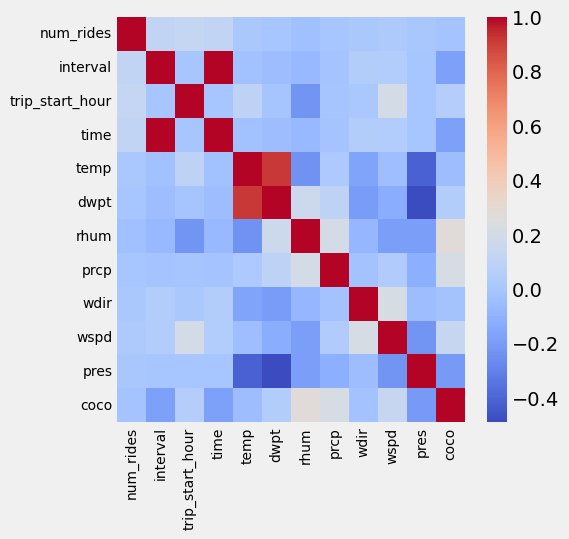

In [115]:
fig, ax = plt.subplots(1, 1, figsize=(5,5), dpi=100)
corr = counts_30mins_num_rides.corr()
plot = sb.heatmap(corr, ax=ax, cmap='coolwarm')
plot = plt.xticks(fontsize=10)
plot = plt.yticks(fontsize=10)

In [117]:
counts_30mins_num_rides = counts_30mins_num_rides.set_index("interval")

In [118]:
counts_daily_num_rides = counts_30mins_num_rides.resample("H").mean()

C:\Users\armym\AppData\Local\Temp\ipykernel_23060\3080638948.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  counts_daily_num_rides = counts_30mins_num_rides.resample("H").mean()


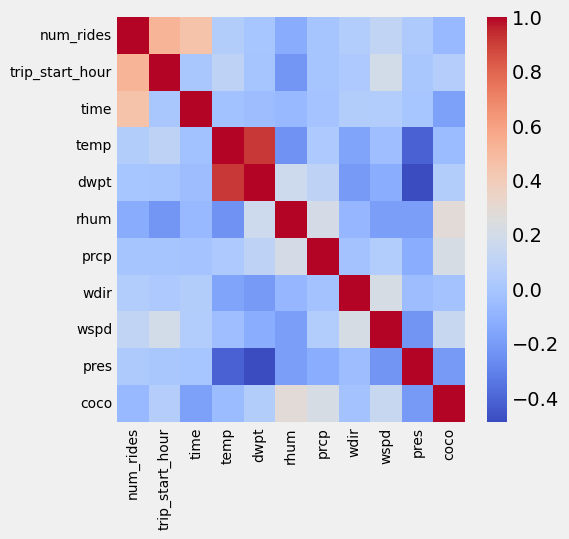

In [119]:
fig, ax = plt.subplots(1, 1, figsize=(5,5), dpi=100)
corr = counts_daily_num_rides.corr()
plot = sb.heatmap(corr, ax=ax, cmap='coolwarm')
plot = plt.xticks(fontsize=10)
plot = plt.yticks(fontsize=10)

There seems to be a huge dropoff in number of rides when tempuratures dip below around -10 and spikes when it goes above

In [238]:
query = """ 
 SELECT 
    time_bucket(INTERVAL '30 minutes', trip_start_timestamp) as interval,
    count(trip_id) as num_rides,
    AVG(fare) as average_fare,
    AVG(trip_total) as average_trip_total,
    MAX(trip_start_day_of_week) as trip_start_day_of_week,
    MAX(trip_start_hour) as trip_start_hour
FROM RIDES_EXTRA_VARS
GROUP BY interval
"""

counts_30mins_non_conditional_on_com = fetch_df_from_query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

In [239]:
counts_30mins_non_conditional_on_com = counts_30mins_non_conditional_on_com.merge(weather, left_on="interval", right_on="time", how ="left")

In [240]:
counts_30mins_non_conditional_on_com = counts_30mins_non_conditional_on_com.set_index("interval")

In [241]:
counts_30mins_non_conditional_on_com = counts_30mins_non_conditional_on_com.sort_index()

In [242]:
counts_30mins_non_conditional_on_com = counts_30mins_non_conditional_on_com.ffill()

Text(0, 0.5, 'Number of Rides')

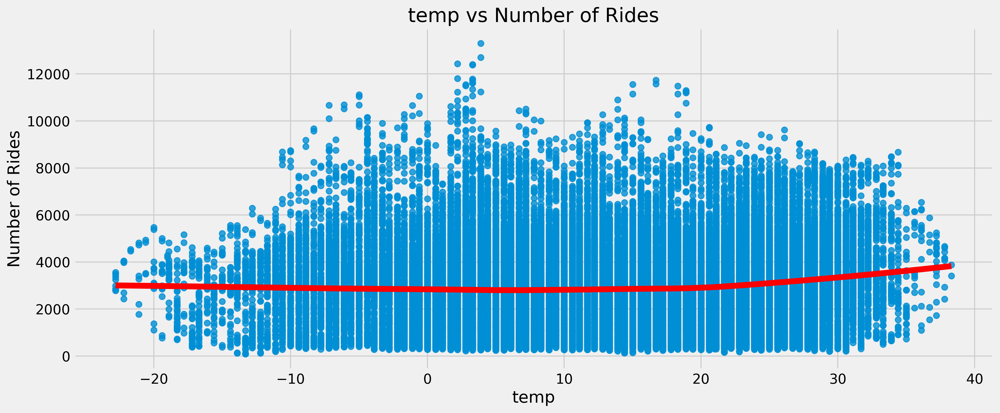

In [243]:
# Variable to plot against num rides
# weather vars : 'temp', 'dwpt', 'rhum', 'prcp', 'wdir', 'wspd', 'pres', 'coco'
weather_variable = 'temp'


fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
sb.regplot(
    data=counts_30mins_non_conditional_on_com,
    x=weather_variable,
    y='num_rides',
    lowess=True,
    line_kws={"color": "red"}
)
plt.title(f"{weather_variable} vs Number of Rides")
plt.xlabel(weather_variable)
plt.ylabel("Number of Rides")


### Violinplot for windspeed

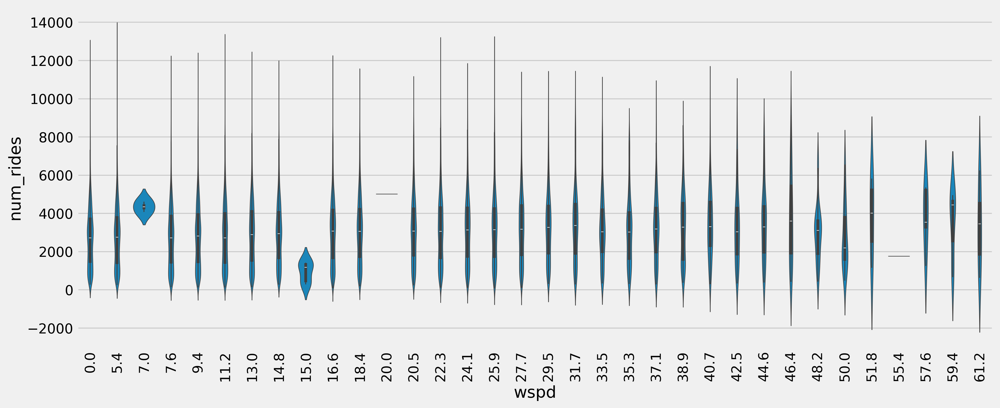

In [165]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
sb.violinplot(
    data=counts_30mins_non_conditional_on_com,
    x='wspd',
    y='num_rides'
)
_ = plt.xticks(rotation=90)

### Plot number of rides and tempurature

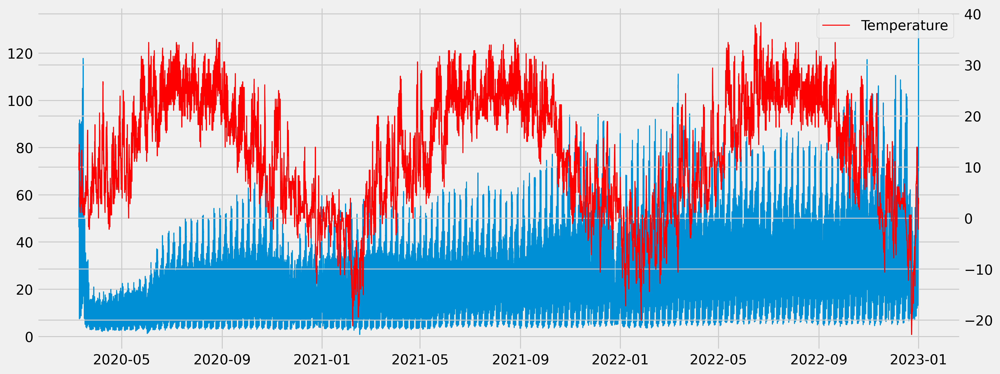

In [244]:
fig, ax = plt.subplots(1, 1, figsize=(15,6), dpi=300)
plt.plot(
    counts_30mins_non_conditional_on_com['num_rides']/100, label='Number of Rides',
    linewidth=1)

ax2 = ax.twinx()
ax2.plot(counts_30mins_non_conditional_on_com['temp'], label='Temperature',
        linewidth=1, color='red')
plt.legend()

### Aggregate to hourly level

In [266]:
# Variable to plot against num rides
# weather vars : 'temp', 'dwpt', 'rhum', 'prcp', 'wdir', 'wspd', 'pres', 'coco'
variable_to_plot = 'rhum'

In [267]:
counts_30mins_non_conditional_on_com_hour = counts_30mins_non_conditional_on_com\
    .reset_index()\
    .groupby(['trip_start_hour'])\
    .mean()

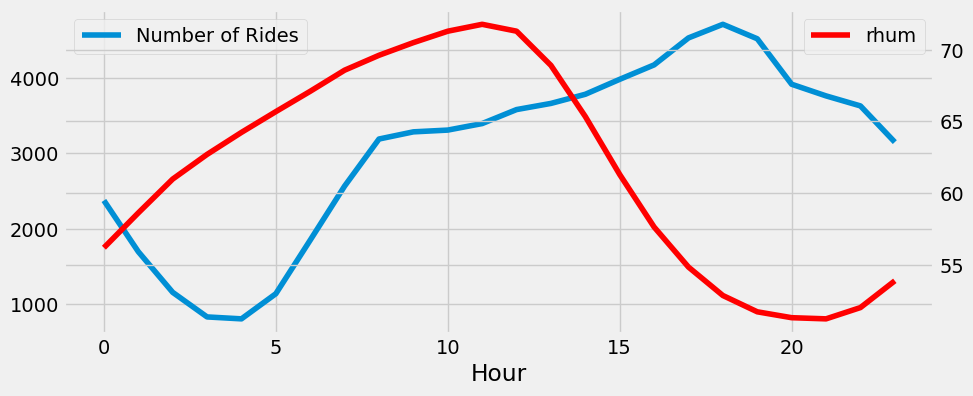

In [268]:
fig, ax1 = plt.subplots(figsize=(10, 4))
ax1.plot(
    counts_30mins_non_conditional_on_com_hour['num_rides'],
    label='Number of Rides'
)
ax1.legend(loc='upper left')
ax1.set_xlabel("Hour")

ax2 = ax1.twinx()
ax2.plot(counts_30mins_non_conditional_on_com_hour[variable_to_plot],
    color='red',
    label=variable_to_plot
)
ax2.legend(loc='upper right')

When variable_to_plot is set to temp, we see there is clear cross-correlation between tempurature and number of rides

### Condition on month

In [258]:
month = 12
counts_30mins_non_conditional_on_com_month = counts_30mins_non_conditional_on_com[counts_30mins_non_conditional_on_com.index.month == month]

In [259]:
counts_30mins_non_conditional_on_com_month_hour = counts_30mins_non_conditional_on_com_month\
    .reset_index()\
    .groupby(['trip_start_hour'])\
    .mean()

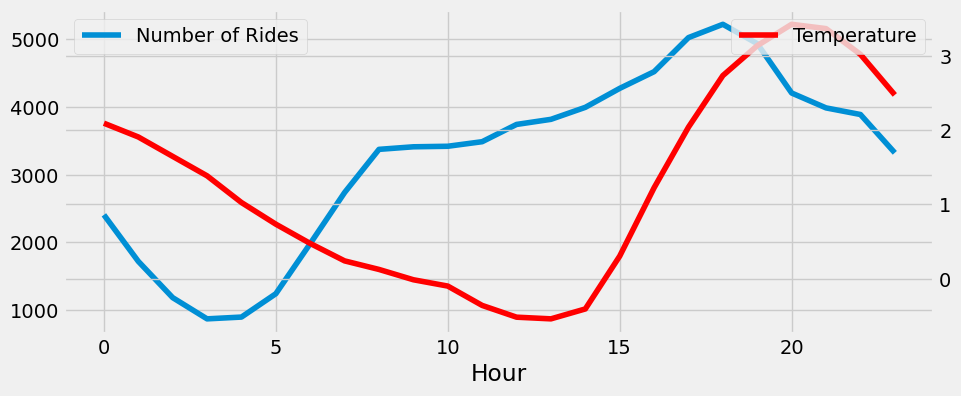

In [269]:
fig, ax1 = plt.subplots(figsize=(10, 4))
ax1.plot(
    counts_30mins_non_conditional_on_com_month_hour['num_rides'],
    label='Number of Rides'
    )
ax1.legend(loc='upper left')
ax1.set_xlabel("Hour")

ax2 = ax1.twinx()
ax2.plot(counts_30mins_non_conditional_on_com_month_hour['temp'],
         color='red',
         label="Temperature"
)
ax2.legend(loc='upper right')

In [ ]:
# !!! Run after done running cells !!!
conn.close()

So we see there is clear cross-correlation between tempurature and number of rides